# Noise Demo — stim0150 (chair, variant 15)
Adds Gaussian noise at several σ levels to the original stimulus and displays them side by side.

In [5]:
import sys

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from config_const import HVM_STIM_DIR, HVM_CATEGORIES, HVM_N_VAR

In [6]:
STIM_IDX = 150
IMAGE_SIZE = 512

cat = HVM_CATEGORIES[STIM_IDX // HVM_N_VAR]
var = STIM_IDX % HVM_N_VAR
orig = Image.open(HVM_STIM_DIR / cat / f'{var:02d}.png').convert('RGB').resize(
    (IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS
)
print(f'stim{STIM_IDX:04d}: category={cat}, variant={var}, size={orig.size}')

stim0150: category=chair, variant=15, size=(512, 512)


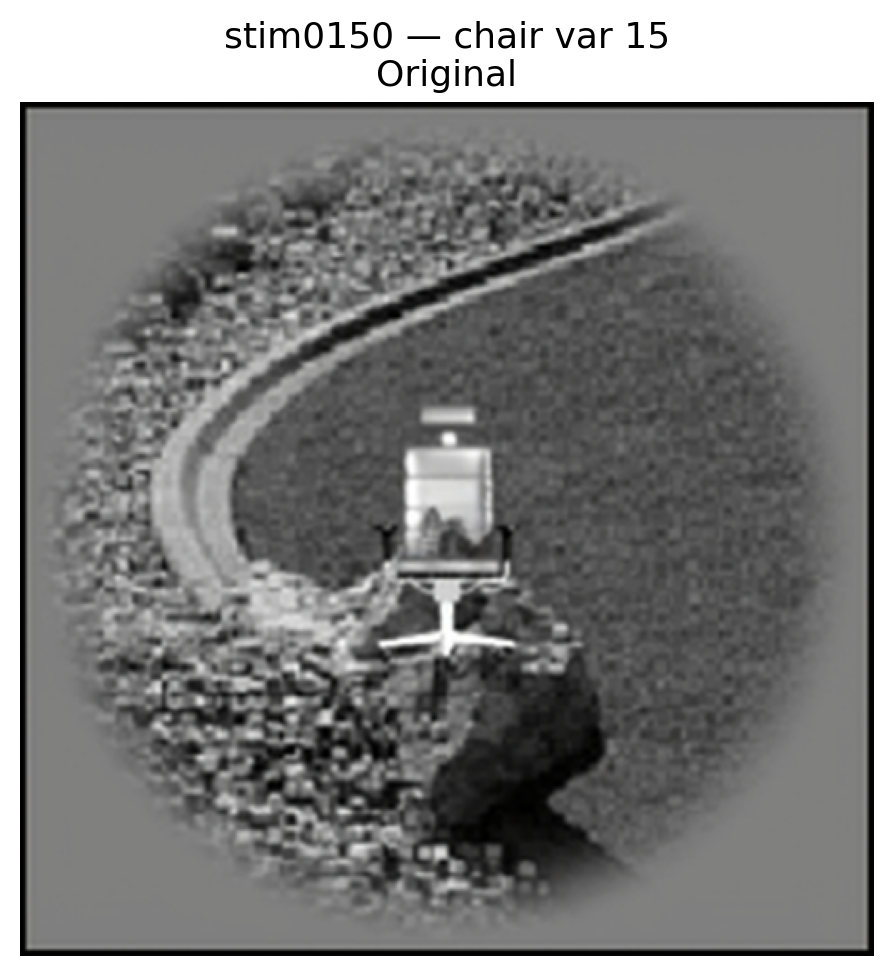

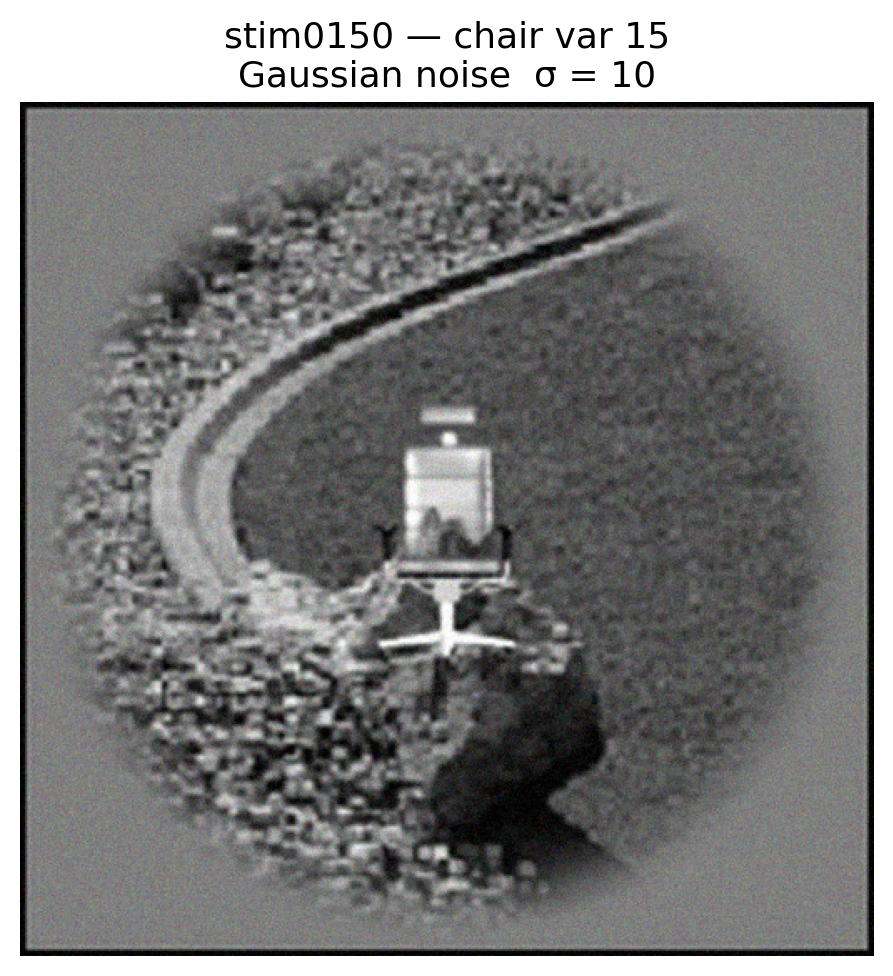

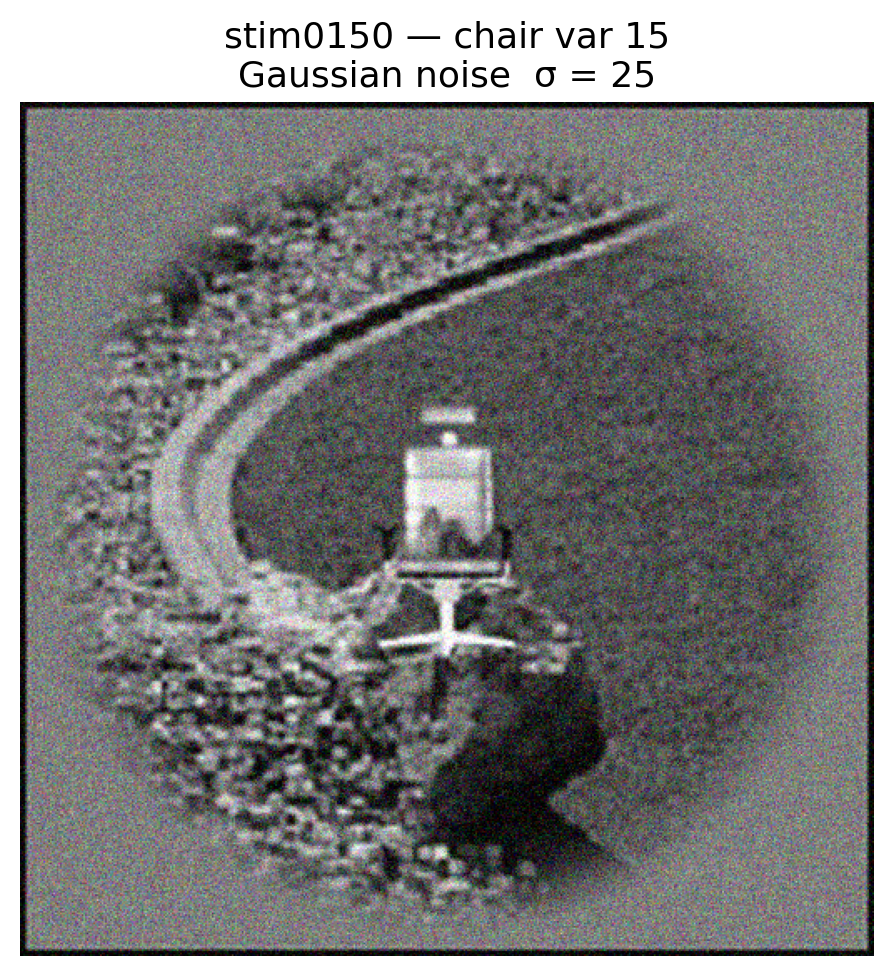

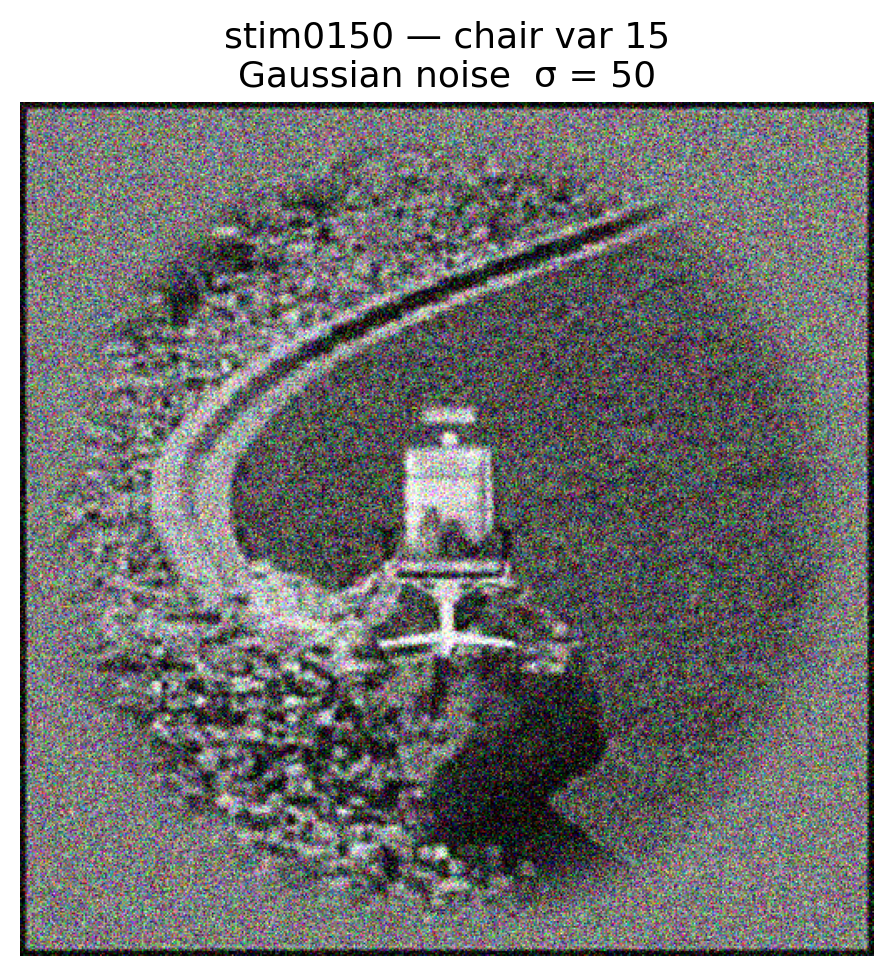

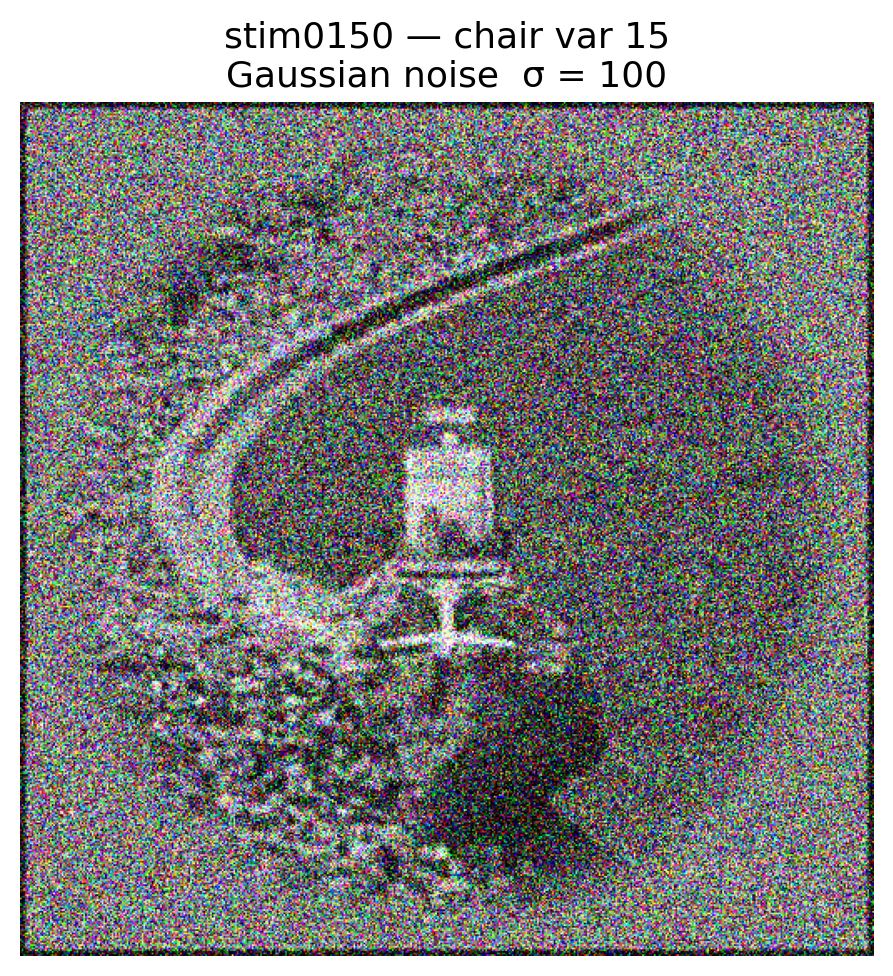

In [7]:
def add_gaussian_noise(img: Image.Image, sigma: float, seed: int = 0) -> Image.Image:
    rng = np.random.default_rng(seed)
    arr = np.array(img, dtype=np.float32)
    noisy = arr + rng.normal(0, sigma, arr.shape)
    return Image.fromarray(np.clip(noisy, 0, 255).astype(np.uint8))

sigmas = [0, 10, 25, 50, 100]
noisy_images = [add_gaussian_noise(orig, s) for s in sigmas]

for img, s in zip(noisy_images, sigmas):
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(img)
    ax.set_title(
        f'stim{STIM_IDX:04d} — {cat} var {var:02d}\n' +
        ('Original' if s == 0 else f'Gaussian noise  σ = {s}'),
        fontsize=13
    )
    ax.axis('off')
    plt.tight_layout()
    plt.show()